<div class="title">Supervised Learning: Case Study</div>
<div class="subtitle">Machine Learning</div>
---


**Configuration**

This cell defines the general configuration of Jupyter Notebook.

In [1]:
%%html
<head><link rel="stylesheet" href="style.css"></head>

This cell imports the packages to be used.

In [4]:
# Standard packages.
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import sys

# Custom packages.
from ml import (
	evaluate_model_clas,
	plot_dataset_clas,
	save_predictions,
	show_function,
)

# Initialisations.
matplotlib.rc("figure", figsize=(15, 5))
sys.dont_write_bytecode = True

# Supervised Learning Case Study

The following aspects will be taken into account when evaluating the assignment.


* Analyse the data.


* Preprocess the features automatically using *pipelines*.


* Adjust the hyper-parameters with a validation stage.


* Try different models to improve the performance, at least:
    * (Regularized) Logistic Regression.
    * SVC.
    * ANNs.


* Try interpretable models to check the important features (e.g. Lasso).


* Submit the prediction several times (the evolution of the performance will be also considered).


* Any other approach that may improve either the performance or interpretability of the model (e.g. feature selection, ensembles...).


* Analyse the results obtained after each experiment, and make decisions following the conclusions.

## Utilities

Some utilities are given next as a starting point, but the teams can defined any other tools that they may need.

### Team Number

The **number of the team** should be inserted here, so that the file of predictions has the appropriate name.

In [5]:
################################################################################
# The team number should be inserted here:
team_number = 2
################################################################################

### Evaluation of the Model

The following function evaluates a multiclass model (already fitted), computing and showing the accuracy and balanced accuracy over both the training and test partitions.

In [4]:
show_function(evaluate_model_clas)

```python
def evaluate_model_clas(model, x_tr, y_tr, x_te, y_te, print_table=True):
    y_tr_p = model.predict(x_tr)
    y_te_p = model.predict(x_te)

    er_tr = [accuracy_score(y_tr, y_tr_p), balanced_accuracy_score(y_tr, y_tr_p)]
    er_te = [accuracy_score(y_te, y_te_p), balanced_accuracy_score(y_te, y_te_p)]

    ers = [er_tr, er_te]
    headers = ["Acc", "Bal. Acc"]

    if print_table:
        print("{:>15}".format(""), end="")
        for h in headers:
            print("{:>15}".format(h), end="")
        print("")

        headers_col = ["Train", "Test"]

        cnt = 0
        for er in ers:
            hc = headers_col[cnt]
            cnt = cnt + 1
            print("{:<15}".format(hc), end="")

            for e in er:
                print("{:15.2f}".format(e), end="")
            print("")

    return ers
```

### Submission of the Predictions

The following function saves the predictions on the **challenge partition** to a file with syntax `Team_TT_YYYYMMDD-HHMMSS.pred`, where `TT` stands for the team number, and `YYYYMMDD-HHMMSS` is a timestamp to distinguish the different submissions of a team.

In [5]:
show_function(save_predictions)

```python
def save_predictions(y_ch_p, team_number, n_preds=500):
    if len(y_ch_p) != n_preds:
        print(
            "Error saving the predictions, it should be a vector of %d lables" % n_preds
        )
    else:
        time_str = time.strftime("%Y%m%d-%H%M%S")
        np.savetxt("Team_{:02d}_{}.txt".format(team_number, time_str), y_ch_p, fmt="%d")
```

Once the prediction file has been generated, it can be uploaded to Moodle.
It is important to **avoid renaming the files**.

## Dataset

A real dataset will be tackled in this practical assignment.
In particular, the [fetal health](https://www.kaggle.com/andrewmvd/fetal-health-classification) dataset of Kaggle, that aims to classify the fetal health in three classes:
1. Normal.
2. Suspect.
3. Pathological.

The input data are a set of $21$ variables extracted from the cardiotocographies (CTGs) which is a simple and cost accessible option to assess fetal health and works by sending ultrasound pulses and reading its response. The variables measured are:
1. light decelerations
2. abnormal short term variability
3. severe decelerations
4. histogram median
5. uterine contractions
6. histogram mode
7. mean value of short term variability
8. histogram tendency
9. histogram number of zeroes
10. histogram number of peaks
11. histogram min
12. baseline value
13. accelerations
14. histogram mean
15. percentage of time with abnormal long term variability
16. histogram width
17. mean value of long term variability
18. prolongued decelerations
19. histogram variance
20. fetal movement
21. histogram max


### Load of the Dataset

This cell loads the data, in particular three partitions:
1. A training partition, given by `x_tr` and `y_tr`, to train (and validate) the models.
2. A test partition, given by `x_te` and `y_te`, to estimate the performance of the model.
3. A challenge partition, given by `x_ch`. The real labels are unknown, and hence the predictions should be submitted to know the real performance of the model.

In [6]:
prefix = "./data/fetal_health"

x_tr = np.loadtxt(prefix + "_tr.dat")
x_te = np.loadtxt(prefix + "_te.dat")
x_ch = np.loadtxt(prefix + "_ch.dat")

y_tr = np.loadtxt(prefix + "_tr.lab")
y_te = np.loadtxt(prefix + "_te.lab")

features = [line.rstrip("\n") for line in open("./data/fetal_health.head")]
n_features = len(features)

### Data Analysis

To analyse the data, we must first put the training and test data sets into only one data set and add the name of the columns.

In [12]:
import pandas as pd

x = np.vstack((x_tr, x_te))

df = pd.DataFrame(x, columns=features)

df.head(5)

,light decelerations,abnormal short term variability,severe decelerations,histogram median,uterine contractions,histogram mode,mean value of short term variability,histogram tendency,histogram number of zeroes,histogram number of peaks,...,baseline value,accelerations,histogram mean,percentage of time with abnormal long term variability,histogram width,mean value of long term variability,prolongued decelerations,histogram variance,fetal movement,histogram max
0,0.000,36.0,0.0,154.0,0.004,154.0,1.9,1.0,0.0,6.0,...,130.0,0.008,148.0,0.0,118.0,20.5,0.0,26.0,0.013,172.0
1,0.001,53.0,0.0,156.0,0.002,157.0,0.7,1.0,1.0,4.0,...,146.0,0.000,152.0,44.0,70.0,8.1,0.0,8.0,0.000,163.0
2,0.000,73.0,0.0,159.0,0.004,158.0,0.7,0.0,0.0,2.0,...,148.0,0.008,159.0,0.0,82.0,9.9,0.0,11.0,0.005,198.0
3,0.003,47.0,0.0,157.0,0.000,159.0,1.4,1.0,0.0,8.0,...,150.0,0.002,154.0,10.0,145.0,12.1,0.0,13.0,0.000,197.0
4,0.000,57.0,0.0,168.0,0.006,170.0,0.5,0.0,0.0,1.0,...,159.0,0.000,167.0,0.0,22.0,8.1,0.0,2.0,0.000,177.0


In [13]:
# We see the number of dimensions.
df.shape

(1626, 21)

We see that there are more samples that variables being measured. Now we will do some statistical measures of the data.

In [14]:
df.describe().T.style

,count,mean,std,min,25%,50%,75%,max
light decelerations,1626.000000,0.001853,0.002925,0.000000,0.000000,0.000000,0.003000,0.015000
abnormal short term variability,1626.000000,46.971710,17.268071,12.000000,32.000000,48.000000,61.000000,87.000000
severe decelerations,1626.000000,0.000004,0.000061,0.000000,0.000000,0.000000,0.000000,0.001000
histogram median,1626.000000,138.250923,14.477603,77.000000,129.000000,140.000000,148.000000,186.000000
uterine contractions,1626.000000,0.004351,0.002962,0.000000,0.002000,0.004000,0.006000,0.015000
histogram mode,1626.000000,137.560886,16.671938,60.000000,129.000000,139.000000,148.000000,187.000000
mean value of short term variability,1626.000000,1.317712,0.875664,0.200000,0.700000,1.200000,1.700000,7.000000
histogram tendency,1626.000000,0.324108,0.613788,-1.000000,0.000000,0.000000,1.000000,1.000000
histogram number of zeroes,1626.000000,0.318573,0.688802,0.000000,0.000000,0.000000,0.000000,10.000000
histogram number of peaks,1626.000000,4.005535,2.870427,0.000000,2.000000,3.000000,6.000000,16.000000


We see that there is a great variability in the different variables, so normalization is required before doing any prediction.

In [15]:
df_y1 = pd.DataFrame(y_tr, columns=["type"])
df_y2 = pd.DataFrame(y_te, columns=["type"])

df_y = pd.concat([df_y1, df_y2], axis=0, ignore_index= True)

df_y

,type
0,1.0
1,2.0
2,1.0
3,2.0
4,1.0
...,...
1621,3.0
1622,3.0
1623,1.0
1624,1.0


In [16]:
df_unido = pd.concat([df_y, df], axis=1)

df_unido.head(5)

,type,light decelerations,abnormal short term variability,severe decelerations,histogram median,uterine contractions,histogram mode,mean value of short term variability,histogram tendency,histogram number of zeroes,...,baseline value,accelerations,histogram mean,percentage of time with abnormal long term variability,histogram width,mean value of long term variability,prolongued decelerations,histogram variance,fetal movement,histogram max
0,1.0,0.000,36.0,0.0,154.0,0.004,154.0,1.9,1.0,0.0,...,130.0,0.008,148.0,0.0,118.0,20.5,0.0,26.0,0.013,172.0
1,2.0,0.001,53.0,0.0,156.0,0.002,157.0,0.7,1.0,1.0,...,146.0,0.000,152.0,44.0,70.0,8.1,0.0,8.0,0.000,163.0
2,1.0,0.000,73.0,0.0,159.0,0.004,158.0,0.7,0.0,0.0,...,148.0,0.008,159.0,0.0,82.0,9.9,0.0,11.0,0.005,198.0
3,2.0,0.003,47.0,0.0,157.0,0.000,159.0,1.4,1.0,0.0,...,150.0,0.002,154.0,10.0,145.0,12.1,0.0,13.0,0.000,197.0
4,1.0,0.000,57.0,0.0,168.0,0.006,170.0,0.5,0.0,0.0,...,159.0,0.000,167.0,0.0,22.0,8.1,0.0,2.0,0.000,177.0


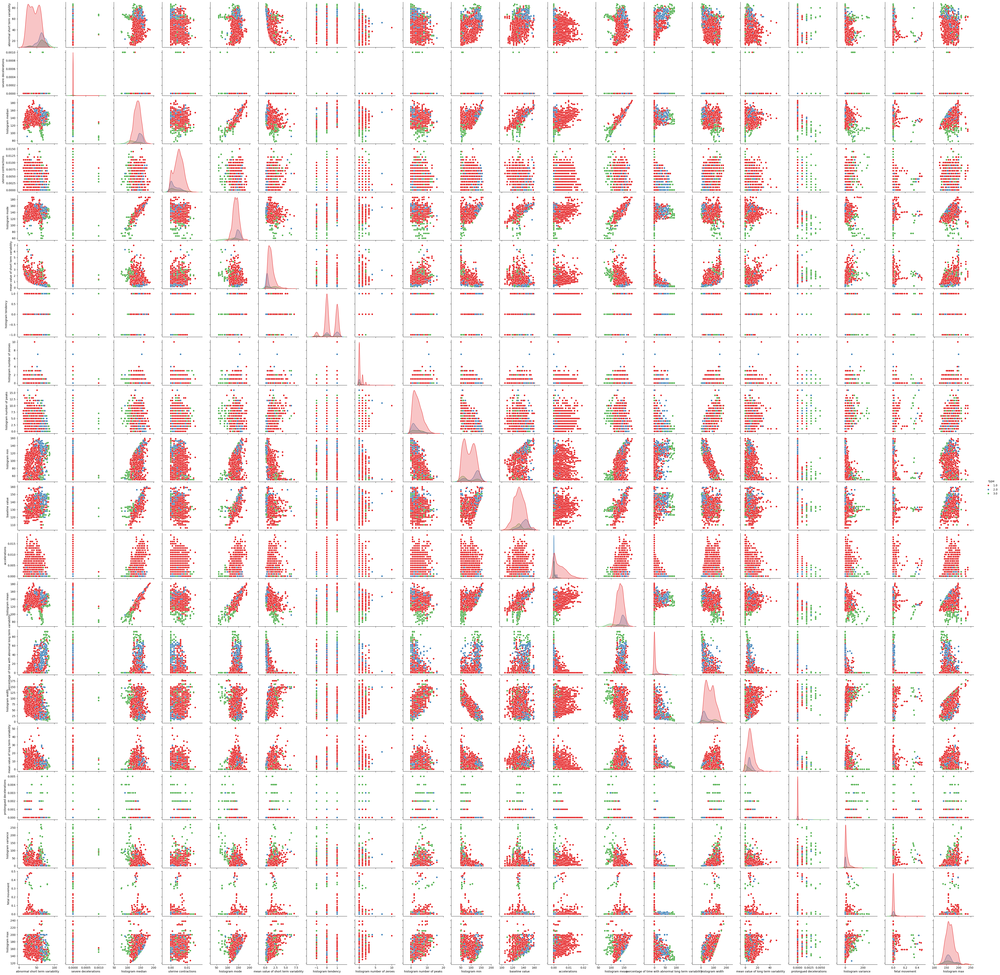

In [17]:
import seaborn as sns  

features_mean = list(df.columns[1:22]) 

sns.pairplot(df_unido, hue='type', vars=features_mean, palette='Set1')
plt.show()

The previous diagram is very complex, but we can see several patterns:
- There is a great amount of overlapping of the three groups for the different characteristics, which show that no feature can be used individually to distinguish among classes.
- Some characteristics may be redundant due to its high correlation to other characteristics. This can be seen in the cases of histogram mean, histogram mode and histogram median, which are very correlated to each other.

Now we are going to see the number of samples that are in each class.

In [12]:
for lab in np.unique(y_tr):
    n_sam = np.sum(y_tr == lab)
    print(
        "Class {}: {:3d} samples ({:5.2f}%)".format(
            lab, n_sam, 100.0 * n_sam / len(y_tr)
        )
    )

Class 1.0: 877 samples (77.89%)
Class 2.0: 156 samples (13.85%)
Class 3.0:  93 samples ( 8.26%)


This multiclass classification problem has the particular challenge that it is markedly imbalaced. There are many more Normal (77.89%) than Suspect (13.85%) or Pathological (8.26%).

### Model 0 - Dummy Classifier

The `DummyClassifier` makes predictions ignoring the input features. The results could serve as a baseline to compare against other more complex classifiers.\
The `strategy` parameter sets a specific behavior to obtain this baseline. Here we use “most_frequent” which always returns the most frequent class label in the observed `y` argument passed to fit.

In [13]:
from sklearn.dummy import DummyClassifier

In [14]:
model = DummyClassifier(strategy="most_frequent")
model.fit(x_tr, y_tr)

evaluate_model_clas(model, x_tr, y_tr, x_te, y_te)

                           Acc       Bal. Acc
Train                     0.78           0.33
Test                      0.78           0.33


[[0.7788632326820604, 0.3333333333333333], [0.778, 0.3333333333333333]]

In [15]:
# y_ch = model.predict(x_ch)
# save_predictions(y_ch, team_number)

### Results interpretation

The results will be interpreted according to the **accuracy (Acc)** and **balanced accuracy (Bal. Acc)**.

* Accuracy measures the **total percentage of right guesses**. It does not distinguish between balanced or unbalanced classes:

  $$
  \text{Acc} = \frac{\text{TP+TN}}{\text{TP+TN+FP+FN}} = \frac{\text{Total correct predictions}}{\text{Total samples}}
  $$


* Balanced Accuracy is the average of the **recall (sensitivity)** per class, represents the *true positive rate*. It penalizes wrong predictions of minority classes:

  $$
  \text{Bal. Acc} = \frac{1}{n\_clases} \sum_{i=1}^{n\_clases} \frac{TP_i}{TP_i + FN_i}
  $$


As we can see with the `Dummy Classifier` we obtained a balanced accuracy of 0.33, which makes complete sense since we are only predicting one class label (the most frequent) and we have three in total. Therefore we are failing to predict well the remaining 66%. In fact the accuracy of ~0.7789, is due to the fact that 77.88\% of the samples are part of class 1.

This classifier is very naive and better methods will be presented in the following discussion.

## Logistic Regression

### Model 1 – Simple Logistic Regression

We will be simply using `LogisticRegression` with no penalties. By default the 'lbfgs' solver is used, which is efficient for multiclass problems. By setting penalty to 'None', regularization is disabled (no lasso or ridge penalty applied).

In [7]:
from sklearn.linear_model import LogisticRegression

In [12]:
modelLLR = LogisticRegression(penalty=None, max_iter=5000)
modelLLR.fit(x_tr, y_tr)

evaluate_model_clas(modelLLR, x_tr, y_tr, x_te, y_te)

                           Acc       Bal. Acc
Train                     0.90           0.77
Test                      0.88           0.76


C:\Users\LucMa\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\sklearn\linear_model\_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[[0.8952042628774423, np.float64(0.7690279950919227)],
 [0.882, np.float64(0.7623923279262174)]]

In [ ]:
# Prediction for the challenge
# y_chLLR = modelLLR.predict(x_ch_scaled)
# save_predictions(y_chLLR, team_number)

The most simple approach with a model of `Logistic Regression` yields a high accuracy (0.89) with low balanced accuracy (0.74). This is probably due to mostly predicting right the majority class, while missing the least represented classes. Therefore obtaining biased results. To solve this we should apply **balance to class weights**.

Moreover, these predictions could be affected negatively by the fact that **standardization** is not performed. As we have seen when we analyzed the data, our features have very different ranges of gradients, the larger ones will have more weight and dominate, and the model will be trained in an unbalanced manner.

### Model 2 - Improved Logistic Regresion

In [2]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score


Now we will use `LogisticRegression`, and as previously mentioned, we start by standardizing the datasets with `StandardScaler()`.\
We will also apply different regularization types (`None, 'l1', 'l2', 'elasticnet'`) to avoid overfitting.

A hyperparameter search using `GridSearchCV` is performed to find the best value for the regularization strength C, ranging from 0.01 to 100, spaced exponentially as recommended in the scikit-learn documentation. The model is trained with each C using 5-fold cross-validation to select the one that yields the best performance.

We also set `class_weight='balanced'` to handle the class imbalance in the dataset.

We changed to `saga` solver because it supports all regularization types (l1, l2, elasticnet, and none), and it scales better with large datasets and sparse data compared to `lbfgs`, which only supports l2 and no penalty. `saga` is also more efficient for problems, like ours, where the number of samples is much larger than the number of features.

#### Standardization

In [10]:
scaler = StandardScaler()
x_tr_scaled = scaler.fit_transform(x_tr)
x_te_scaled = scaler.transform(x_te)
x_ch_scaled = scaler.transform(x_ch)

In [ ]:
# Grid search for C hyperparameter 
param_grid = {'C': [0.01, 0.1, 1, 10, 100]}  # C is the inverse regularization parameter (smaller values = stronger regularization)

#### Model 2.1 - No penalties

In [12]:
modelLR_fixed = LogisticRegression(solver='saga',
                                   max_iter=5000,  # increase iterations to allow convergence
                                   penalty=None,  # no regularization
                                   class_weight='balanced')

modelLR_fixed.fit(x_tr_scaled, y_tr)  # No grid search here, we fit directly without tuning C

# Evaluation
evaluate_model_clas(modelLR_fixed, x_tr_scaled, y_tr, x_te_scaled, y_te)


                           Acc       Bal. Acc
Train                     0.88           0.88
Test                      0.86           0.83


[[0.8801065719360568, np.float64(0.8751055918819923)],
 [0.864, np.float64(0.8317067199316869)]]

In [ ]:
# Prediction for the challenge
# y_ch = modelLR_fixed.predict(x_ch_scaled)
# save_predictions(y_ch, team_number)

#### Model 2.2 - Lasso

In [13]:
lasso_saga = LogisticRegression(penalty='l1',
                                solver='saga',
                                max_iter=1000000,
                                class_weight='balanced',
                                verbose=1)
# L1 regularization (Lasso) > can shrink some coefficients to zero

gs_saga = GridSearchCV(lasso_saga, param_grid, cv=5, n_jobs=-1,
                       scoring='balanced_accuracy')  # Hyperparameter search
gs_saga.fit(x_tr_scaled, y_tr)

print("Best C:", gs_saga.best_params_['C'])

# Evaluation
evaluate_model_clas(gs_saga.best_estimator_, x_tr_scaled, y_tr, x_te_scaled, y_te)

convergence after 96041 epochs took 81 seconds
Best C: 0.1
                           Acc       Bal. Acc
Train                     0.87           0.87
Test                      0.84           0.82


[[0.872113676731794, np.float64(0.8690990760729975)],
 [0.844, np.float64(0.8203063932952954)]]

In [ ]:
# Prediction for the challenge
# y_ch = gs_saga.best_estimator_.predict(x_ch_scaled)
# save_predictions(y_ch, team_number)

#### Model 2.3 - Ridge

In [14]:
ridge_saga = LogisticRegression(penalty='l2', # L2 regularization (Ridge)
                                solver='saga',
                                max_iter=1000000,
                                class_weight='balanced')

gs_saga_ridge = GridSearchCV(ridge_saga, param_grid, cv=5, n_jobs=-1,
                             scoring='balanced_accuracy')
gs_saga_ridge.fit(x_tr_scaled, y_tr)

print("Best C:", gs_saga_ridge.best_params_['C'])

# Evaluation
evaluate_model_clas(gs_saga_ridge.best_estimator_, x_tr_scaled, y_tr, x_te_scaled, y_te)

Best C: 0.1
                           Acc       Bal. Acc
Train                     0.88           0.87
Test                      0.85           0.82


[[0.8765541740674956, np.float64(0.8709994941649777)],
 [0.854, np.float64(0.8245908834409681)]]

In [ ]:
# Prediction for the challenge
# y_ch = gs_saga_ridge.best_estimator_.predict(x_ch_scaled)
# save_predictions(y_ch, team_number)

#### Model 2.4 - Elastic net

In [15]:
EN_saga = LogisticRegression(penalty='elasticnet', # Elastic Net regularization: mix of L1 and L2
                             solver='saga',
                             max_iter=1000000,
                             class_weight='balanced')

param_grid_EN = {
    'C': [0.01, 0.1, 1, 10, 100],
    'l1_ratio': np.linspace(0, 1, 11)  # steps of 0.1: from pure L2 (0) to pure L1 (1)
}

gs_saga_EN = GridSearchCV(EN_saga, param_grid_EN, cv=5, n_jobs=-1,
                          scoring='balanced_accuracy')
gs_saga_EN.fit(x_tr_scaled, y_tr)

print("Best params:", gs_saga_EN.best_params_)

# Evaluation
evaluate_model_clas(gs_saga_EN.best_estimator_, x_tr_scaled, y_tr, x_te_scaled, y_te)

Best params: {'C': 0.1, 'l1_ratio': np.float64(0.7000000000000001)}
                           Acc       Bal. Acc
Train                     0.87           0.87
Test                      0.85           0.83


[[0.8703374777975134, np.float64(0.8683389088362053)],
 [0.85, np.float64(0.8301502706543774)]]

In [ ]:
# Prediction for the challenge
# y_ch = gs_saga_EN.best_estimator_.predict(x_ch_scaled)
# save_predictions(y_ch, team_number)

### Logistic Regression Conclusions
Regularization led to worse performance compared to using no penalty at all. This outcome is likely due to the nature of the dataset, where the number of samples greatly exceeds the number of features (N >> D). In such cases, the model is less likely to overfit, and applying regularization can unnecessarily constrain the model, reducing its predictive power.

Additionally, we did not use the dual formulation of the solvers, as recommended by scikit-learn when n_samples > n_features, which aligns with our data configuration.

## SVC

The next classification function we will use is SVC. Apart from having self-regularization (C parameter), can be used to analyse non-linear relationships between the data and the classes. This can be made by taking advantage of the kernel trick, and try different kernel functions (linear, RBF, polynomic). 

:::
SVC does not support multiclass clasification as `LogisticRegression`, but rather use a one-vs-one stratregy, which consist on training binary clasifiers with all pairs of classes. At test time, a majority voting between those models is obtained to assign the predicted class. 



### Model 1 - Linear SVC

This classifier is used to compare with `LogisticRegression` predictions, as both are linear. Because of this, drastic changes are not expected. As with previous examples, we apply class weighting and score hyperparameters with balanced accuracy.

In [ ]:
from sklearn.svm import SVC

In [ ]:
svc_lin = SVC(kernel='linear', class_weight='balanced')

gs_svc_lin = GridSearchCV(svc_lin, param_grid, cv=5, n_jobs=-1,
                          scoring='balanced_accuracy')

gs_svc_lin.fit(x_tr_scaled, y_tr)

print("Best C:", gs_svc_lin.best_params_)

# Evaluación
evaluate_model_clas(gs_svc_lin.best_estimator_, x_tr_scaled, y_tr, x_te_scaled, y_te)

Best C: {'C': 0.1}
                           Acc       Bal. Acc
Train                     0.88           0.88
Test                      0.86           0.83


[[0.8809946714031972, np.float64(0.8781699178120261)],
 [0.858, np.float64(0.8341146929647776)]]

As expected, results are very similar to logistic regression. The hyperparameter chosen has been the same too, what makes sense because of the linear nature of the model. 

In [ ]:
# Predicción para el challenge
# y_ch = gs_svc_lin.best_estimator_.predict(x_ch_scaled)
# save_predictions(y_ch, team_number)

### Model 2 - RBK kernel SVC

In order to find non-linearities in the data, using a kernel can be very useful, as if better results are obtained, is because the non-linear model can fit the data better. Also, a new hyperparameter has to be searched: `gamma`. This parameter in RBF kernels controls the influence that one training example has. If gamma is large, other examples have to be very simmilar to be affected (as expained in the [user manual](https://scikit-learn.org/stable/modules/svm.html#svm-kernels)). 

::: note
If set to a large value, gamma can overfit, so grid search with cross validation is used. 

In [ ]:
svc_rbf = SVC(kernel='rbf', class_weight='balanced')

param_grid_rbf = {
    'C': [0.01, 0.1, 1, 10, 100],
    'gamma': [1e-3, 1e-2, 0.1, 1, 'scale']
}

gs_svc_rbf = GridSearchCV(svc_rbf, param_grid_rbf, cv=5, n_jobs=-1,
                          scoring='balanced_accuracy')

gs_svc_rbf.fit(x_tr_scaled, y_tr)

print("Best C:", gs_svc_rbf.best_params_)

# Evaluación
evaluate_model_clas(gs_svc_rbf.best_estimator_, x_tr_scaled, y_tr, x_te_scaled, y_te)

Best C: {'C': 1, 'gamma': 0.01}
                           Acc       Bal. Acc
Train                     0.88           0.88
Test                      0.87           0.87


[[0.8809946714031972, np.float64(0.8813740635843111)],
 [0.87, np.float64(0.8655174678812524)]]

In this case, accuracy increased, and is almost the same between train and test samples, so the model is not overfitting. This confirms the presence of some non-linearities in the data. Although existing, they are not predominant, as linear models adjust good enough to the data, as we have analyzed previously. 

In [ ]:
# Predicción para el challenge
# y_ch = gs_svc_lin.best_estimator_.predict(x_ch_scaled)
# save_predictions(y_ch, team_number)

### Model 3 - Polynomic kernel SVC

We have tried a linear kernel, and a non-linear one. A mid-point between these two is the polynomic kernel, who is more structured and may catch non-linearities that RBF kernelcould not. 

In this case, not only we have `C` and `gamma` hyperparameters, but also the degree of the polynomial and the `coef0`. `Coef0` dictates the importance of the linear coefficients of the model. As always, election of hyperparameters is done with grid search and cross validation. 

:::
The highest degree to try was 4, as higher order polynomials can overfit easily, and we just want to compare this model with RBF to see what kind of non-linearities might be present in the data.

In [ ]:
# We make a different para_grid with the extra hyperparameters
param_grid_poly = {
    'C': [0.01, 0.1, 1, 10, 100],
    'gamma': [1e-3, 1e-2, 0.1, 1, 'scale'],
    'degree': [2, 3, 4],
    'coef0': [0.0, 1.0]
}

In [ ]:
svc_poly = SVC(kernel='poly', class_weight='balanced')
gs_poly = GridSearchCV(svc_poly, param_grid_poly, cv=5, scoring='balanced_accuracy', n_jobs=-1)
gs_poly.fit(x_tr_scaled, y_tr)

print("Best params:", gs_poly.best_params_)

# Evaluación
evaluate_model_clas(gs_poly.best_estimator_, x_tr_scaled, y_tr, x_te_scaled, y_te)

Best params: {'C': 10, 'coef0': 1.0, 'degree': 3, 'gamma': 0.01}
                           Acc       Bal. Acc
Train                     0.92           0.94
Test                      0.89           0.86


[[0.9200710479573713, np.float64(0.9406792116267234)],
 [0.89, np.float64(0.8623714279742871)]]

In this case, score is similar to RBF, but there are clear signs of overfitting. There is a much bigger difference between train and test data accuracy than it was with RBF kernel. Unsuprisingly, the 2 order polynomial was not chosen, but neither the 4th grade one, probably because too much overfitting and lack of generalization.

In [ ]:
# Predicción para el challenge
# y_ch = gs_poly.best_estimator_.predict(x_ch_scaled)
# save_predictions(y_ch, team_number)